<h1>Code Modules & Functions</h1>

In [1]:
!pip install --upgrade pip \
--user --quiet --no-warn-script-location
!pip install git+https://github.com/tensorflow/docs \
--user --quiet --no-warn-script-location

  DEPRECATION: tensorflow-docs was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [2]:
import warnings; warnings.filterwarnings('ignore')
import pandas as pd,numpy as np,tensorflow as tf
import h5py,imageio,os,torch
import seaborn as sn,pylab as pl
from tensorflow.keras.preprocessing import image as tkimg
from tensorflow_docs.vis import embed
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from skimage import io; from tqdm import tqdm
from ipywidgets import widgets
from PIL import ImageFile,Image
ImageFile.LOAD_TRUNCATED_IMAGES=True
from torch.utils.data import DataLoader as tdl
from torch.utils.data import Dataset as tds
from torchvision import transforms,utils
dev=torch.device('cuda:0' \
if torch.cuda.is_available() else 'cpu')
from IPython.core.magic import register_line_magic

In [3]:
def paths2tensor(img_paths,file_path,img_size):
    tensor=[]
    for img_path in tqdm(img_paths):
        img0=tkimg.load_img(
            file_path+img_path,
            target_size=(img_size,img_size))
        img=tkimg.img_to_array(img0)
        tensor.append(np.expand_dims(img,axis=0))
    return np.vstack(tensor)
def animate(images):
    converted_images=np.clip(images*255,0,255).astype(np.uint8)
    imageio.mimsave('animation.gif',converted_images)
    return embed.embed_file('animation.gif')
def interpolate_hypersphere(v1,v2,steps):
    v1norm=tf.norm(v1)
    v2norm=tf.norm(v2)
    v2normalized=v2*(v1norm/v2norm)
    vectors=[]
    for step in range(steps):
        interpolated=v1+(v2normalized-v1)*step/(steps-1)
        interpolated_norm=tf.norm(interpolated)
        interpolated_normalized=\
        interpolated*(v1norm/interpolated_norm)
        vectors.append(interpolated_normalized)
    return tf.stack(vectors)
def plcmap(cmap,n):
    return [pl.cm.get_cmap(cmap)(i/n)[:3] for i in range(1,n+1)]

<h1>Ways of Data Processing</h1>

In [4]:
file_path='../input/horse-breeds/'
img_size=160
names=['Akhal-Teke','Appaloosa','Orlov Trotter',
       'Vladimir Heavy Draft','Percheron',
       'Arabian','Friesian']
file_list=sorted(os.listdir(file_path))
labels=np.array([int(el[:2]) for el in file_list],
                dtype=np.int8)-1
images=np.array(paths2tensor(
    file_list,file_path=file_path,img_size=img_size),
    dtype=np.float32)/255
N=labels.shape[0]; n=int(.2*N)
shuffle_ids=np.arange(N)
np.random.RandomState(12).shuffle(shuffle_ids)
images,labels=images[shuffle_ids],labels[shuffle_ids]
x_test,x_train=images[:n],images[n:]
y_test,y_train=labels[:n],labels[n:]
pd.DataFrame([[x_train.shape,x_test.shape],
              [x_train.dtype,x_test.dtype],
              [y_train.shape,y_test.shape],
              [y_train.dtype,y_test.dtype]],               
             columns=['train','test'])

100%|██████████| 670/670 [00:06<00:00, 97.73it/s] 


,train,test
0,"(536, 160, 160, 3)","(134, 160, 160, 3)"
1,float32,float32
2,"(536,)","(134,)"
3,int8,int8


In [5]:
with h5py.File('HorseBreedImages.h5','w') as f:
    f.create_dataset('train_images',data=x_train)
    f.create_dataset('train_labels',data=y_train)
    f.create_dataset('test_images',data=x_test)
    f.create_dataset('test_labels',data=y_test)
os.stat('HorseBreedImages.h5')

os.stat_result(st_mode=33188, st_ino=131083, st_dev=1793, st_nlink=1, st_uid=0, st_gid=0, st_size=205828766, st_atime=1612185179, st_mtime=1612185179, st_ctime=1612185179)

In [6]:
train_csv='train.csv'; test_csv='test.csv'
img_path='../input'
files=[os.path.relpath(os.path.join(dirpath,fn),img_path) \
for (dirpath,dirnames,filenames) in os.walk(img_path) \
for fn in filenames if fn.endswith('.png')]
d={'label':[],'breed':[],'file':[],'path':[]}
for f in files:
    _,fn=f.split('/')
    label=int(fn[:2])-1
    breed=names[label]        
    d['label'].append(label)
    d['breed'].append(breed)
    d['file'].append(fn)
    d['path'].append(f)
df=pd.DataFrame.from_dict(d)
np.random.seed(123)
ids=np.random.rand(len(df))<.8
df_train=df[ids]; df_test=df[~ids]
df_train.set_index('file',inplace=True)
df_train.to_csv(train_csv)
df_test.set_index('file',inplace=True)
df_test.to_csv(test_csv)
num_classes=np.unique(df['label'].values).shape[0]
print([num_classes,len(files)]); df.head()

[7, 670]


,label,breed,file,path
0,0,Akhal-Teke,01_103.png,horse-breeds/01_103.png
1,2,Orlov Trotter,03_068.png,horse-breeds/03_068.png
2,1,Appaloosa,02_060.png,horse-breeds/02_060.png
3,2,Orlov Trotter,03_030.png,horse-breeds/03_030.png
4,6,Friesian,07_065.png,horse-breeds/07_065.png


In [7]:
class HorseBreedsData(tds):
    def __init__(self,csv_path,img_dir,transform=None):
        df=pd.read_csv(csv_path,index_col=0)
        self.img_dir=img_dir
        self.csv_path=csv_path
        self.img_paths=df['path']
        self.y=df['label'].values
        self.transform=transform
    def __getitem__(self,index):
        img=Image.open(os.path\
        .join(self.img_dir,self.img_paths[index]))
        if self.transform is not None:
            img=self.transform(img)
        lbl=self.y[index]
        return img,lbl
    def __len__(self):
        return self.y.shape[0]

In [8]:
batch_size=12; num_workers=4
grayscale=False; img_size=128
trans=transforms\
.Compose([transforms.Resize((img_size,img_size)),
          transforms.ToTensor()])
train=HorseBreedsData(
    csv_path=train_csv,img_dir=img_path,transform=trans)
test=HorseBreedsData(
    csv_path=test_csv,img_dir=img_path,transform=trans)
dataloaders={'train':tdl(dataset=train,batch_size=batch_size,
                         shuffle=True,num_workers=num_workers),
             'test':tdl(dataset=test,batch_size=batch_size,
                        shuffle=True,num_workers=num_workers)}

<h1>Data Representation</h1>

{0, 1, 2, 3, 4, 5, 6}

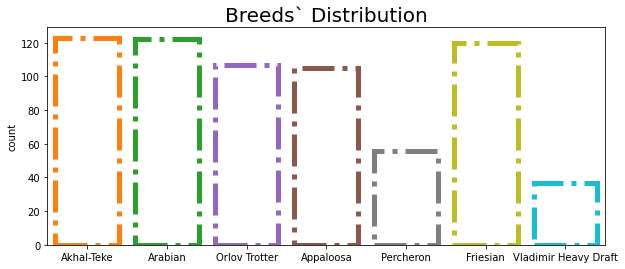

In [9]:
pl.figure(figsize=(10,4))
sn.countplot(x=[names[l] for l in labels],
             facecolor=(0,0,0,0),
             linewidth=5,linestyle='-.',
             edgecolor=plcmap('tab10',7))
pl.title('Breeds` Distribution',fontsize=20)
set(labels)

In [10]:
img=io.imread(file_path+'01_070.png')[:,:,:3]
fig=make_subplots(1,2)
fig.add_trace(go.Image(z=img),1,1)
ti='The Image and the Histogram of Color Values'
for channel,color in enumerate(['red','green','blue']):
    fig.add_trace(
        go.Histogram(
            x=img[...,channel].ravel(),
            opacity=.5,marker_color=color,
            name='%s channel'%color),1,2)
fig.update_layout(height=400,width=700,title_text=ti)
fig.show()

In [11]:
def wimg(n,m):
    display(widgets.Label(
        value='label #%s => '%(n-1)+names[n-1]))
    file_name='0%s'%n+'_00%s'%m+'.png'
    display(widgets.Image(
        value=open(file_path+file_name,'rb').read(),
        format='png',width=200,height=200))
wimg(6,8)

Label(value='label #5 => Arabian')

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01\x00\x00\x00\x01\x00\x08\x06\x00\x00\x00\\r\xa8f\…

In [12]:
fig=make_subplots(1,5); steps=[]
for step in np.arange(1,6,1):
    img=io.imread(file_path+'01_00%s.png'%step)[:,:,:3]
    fig.add_trace(go.Image(z=img),1,int(step))
    fig.data[step-1].visible=False
fig.data[0].visible=True
ti='Akhal-Teke Images'
for i in range(len(fig.data)):
    step=dict(method='update',
              args=[{'visible':[False]*len(fig.data)}])
    step['args'][0]['visible'][i]=True
    steps.append(step)
sliders=[dict(active=0,pad={'t':5},steps=steps)]
fig.update_layout(
    width=650,height=300,sliders=sliders,
    template='plotly_dark',
    title_text=ti,title_font=dict(size=15))
fig.update_xaxes(showticklabels=False)\
   .update_yaxes(showticklabels=False)
fig.show()

In [13]:
@register_line_magic
def display_examples(data):
    for images,labels in dataloaders[data]:  
        print('Image dimensions: %s'%str(images.shape))
        print('Label dimensions: %s'%str(labels.shape))
        n=np.random.randint(1,5)
        fig=pl.figure(figsize=(10,4))
        for i in range(n,n+5):
            ax=fig.add_subplot(1,5,i-n+1,\
            xticks=[],yticks=[],title=names[labels[i].item()])
            ax.imshow(np.transpose(images[i],(1,2,0)))
        break

Image dimensions: torch.Size([12, 4, 128, 128])
Label dimensions: torch.Size([12])


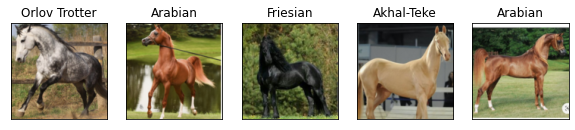

In [14]:
%display_examples test


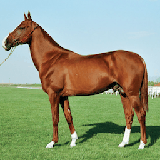

In [15]:
imgs=np.vstack([interpolate_hypersphere(x_test[0],x_test[1],120),
                interpolate_hypersphere(x_test[1],x_test[0],120)])
animate(imgs)